## Project Team Id - PTID-CDS-AUG-23-1603

## Project Id - PRCP-1012-GameWinnerPred

# Problem statement
#### Create a predictive model which is an attemptto predict the win probability of the pubg match and to look at important factors affecting the win probability of the pubg game

# importing data set

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
pb = pd.read_csv('/content/drive/MyDrive/pubg.csv')

In [4]:
pb

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,...,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
0,7f96b2f878858a,4d4b580de459be,a10357fd1a4a91,0,0,0.00,0,0,0,60,...,0,0.0000,0,0.000,0,0,244.80,1,1466,0.4444
1,eef90569b9d03c,684d5656442f9e,aeb375fc57110c,0,0,91.47,0,0,0,57,...,0,0.0045,0,11.040,0,0,1434.00,5,0,0.6400
2,1eaf90ac73de72,6a4a42c3245a74,110163d8bb94ae,1,0,68.00,0,0,0,47,...,0,0.0000,0,0.000,0,0,161.80,2,0,0.7755
3,4616d365dd2853,a930a9c79cd721,f1f1f4ef412d7e,0,0,32.90,0,0,0,75,...,0,0.0000,0,0.000,0,0,202.70,3,0,0.1667
4,315c96c26c9aac,de04010b3458dd,6dc8ff871e21e6,0,0,100.00,0,0,0,45,...,0,0.0000,0,0.000,0,0,49.75,2,0,0.1875
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4446961,afff7f652dbc10,d238e426f50de7,18492834ce5635,0,0,0.00,0,0,0,74,...,0,1292.0000,0,0.000,0,0,1019.00,3,1507,0.1786
4446962,f4197cf374e6c0,408cdb5c46b2ac,ee854b837376d9,0,1,44.15,0,0,0,69,...,0,0.0000,0,0.000,0,0,81.70,6,0,0.2935
4446963,e1948b1295c88a,e26ac84bdf7cef,6d0cd12784f1ab,0,0,59.06,0,0,0,66,...,0,0.0000,0,2.184,0,0,788.70,4,0,0.4815
4446964,cc032cdd73b7ac,c2223f35411394,c9c701d0ad758a,0,4,180.40,1,1,2,11,...,2,0.0000,0,0.000,0,0,2748.00,8,0,0.8000


In [5]:
pb.shape

(4446966, 29)

In [6]:
pb.sample(10)

,Id,groupId,matchId,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,...,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
435067,01eb6cd5fbb241,3112cf5e6c1072,6e03918df231cf,0,0,0.000,0,0,0,86,...,0,0.0,0,0.0,0,0,57.87,1,1504,0.0860
1295467,af84d6d7bb0149,9f04882e6de4d8,fee4a7c0ea2e37,0,0,28.920,0,0,0,73,...,0,0.0,0,0.0,0,0,149.10,2,0,0.2444
259176,7cea251134f4a5,599eb5e2d04f0b,1b9fb25468531f,0,0,0.000,0,0,0,85,...,0,0.0,0,0.0,0,0,78.67,0,0,0.0385
3667141,02ec727d141254,c4dd7113464ae5,44bac1cb1e69b6,1,0,72.980,0,0,1,73,...,0,0.0,0,0.0,0,0,440.70,3,1467,0.2500
4220214,49acc075ba2846,f611664b2e66a9,dde31e871c1a84,1,1,5.059,0,0,2,66,...,0,645.2,0,0.0,0,0,757.80,5,1534,0.4815
4028407,bcf017556a180f,f36865e0f3554a,113a9ea1bd3514,0,0,0.000,0,0,0,82,...,0,0.0,0,0.0,0,0,18.43,2,0,0.1649
1871442,49a79a8e102fc3,9a3dcb311c094f,d960c963f9e547,0,8,300.000,0,2,4,6,...,0,3152.0,0,0.0,0,0,4074.00,7,0,0.9681
3752318,276cfe98e8de3e,366255f056a176,af5309b85d5712,0,0,125.700,0,1,2,37,...,0,0.0,0,0.0,0,0,723.30,3,0,0.5361
2621589,a056d989b9d032,0a7d30d2be7f2b,fee5680a4ef41f,0,0,0.000,0,0,0,82,...,0,0.0,0,0.0,0,0,14.49,2,1500,0.2069
396133,685cf4ffac3082,e8660461df4868,2bcbb778dcb376,0,1,94.350,1,0,5,52,...,0,6802.0,0,0.0,0,0,2819.00,6,0,0.6207


In [7]:
for i in pb.columns:
    print(i,pb[i].unique())
    print(pb[i].value_counts())
    print("**********************")

Id ['7f96b2f878858a' 'eef90569b9d03c' '1eaf90ac73de72' ... 'e1948b1295c88a'
 'cc032cdd73b7ac' '0d8e7ed728b6fd']
7f96b2f878858a    1
d19659ceb5b553    1
b587ef96cf8d87    1
66715fcb3b871d    1
59e0d2fdd292a8    1
                 ..
0f3c9b54ce4173    1
9a91d96d201b22    1
a92d0949e8830e    1
f1d8ef55f70584    1
0d8e7ed728b6fd    1
Name: Id, Length: 4446966, dtype: int64
**********************
groupId ['4d4b580de459be' '684d5656442f9e' '6a4a42c3245a74' ... 'ac3f1b4a56e5ad'
 '408cdb5c46b2ac' '8c74f72fedf5ff']
14d6b54cdec6bc    74
b8275198faa03b    72
128b07271aa012    64
7385e5fe214021    49
e52a2e6ca30474    36
                  ..
5941df37c809be     1
ab58ce5a22ed97     1
7b5f1742ce18a5     1
ed3a2c5863cee3     1
8c74f72fedf5ff     1
Name: groupId, Length: 2026745, dtype: int64
**********************
matchId ['a10357fd1a4a91' 'aeb375fc57110c' '110163d8bb94ae' ... '21beed46753ed9'
 '224a123c53e008' 'fcad6c3fdd847a']
4b5db40aec4797    100
b10e8738adafb9    100
bc28c54250342d    100
c2db47

## Domain Analysis

domain analysis

assist =if you have given damage to the enemy and your team-mate kills the same enemy as you have done some damage on it then it is counted as Assist Kill as both you and your team-mate as taken down the enemy.

boosts- it increase our movement by 30%

damageDealt-PUBG that tracks the total damage you have dealt to enemies

DBNOs-It is a status in PUBG where a player is knocked down but not yet eliminated.

headshotKills-headshotKills in PUBG refers to the number of kills a player has gotten by hitting an enemy in the head

heals - its like a firstaid

killPlace-The killplace column in the PUBG dataset indicates the rank of the player in the match.

killPoints-awarded to Platoons based on the number of Kills the Platoon accumulates during each match

kills-a kill is when you successfully eliminate an enemy player.

killStreaks-It enables players to earn special benefits when going on a killing spree without dying.

longestKill- it is nothing but the longest distance killed by a person

matchDuration-it is nothing but the tiime period

matchType-the type of game mode that you are playing

maxPlace-refers to the highest placement that a player or team can achieve in a match. The maximum placement is 1, which means that the player or team won the match.

numGroups-refers to the number of groups of players that are allowed to queue up together in a match.

rank points-RP are earned by winning matches, getting kills, and placing high in the leaderboard.

revives-The term "revives" in PUBG refers to the ability to bring back a teammate who has been knocked out (DBNO).

rideDistance -total distance traveled in vehicles measured in meters

roadKills-number of kills while in a vehicle

swimDistance-total distance traveled by swimming measured in meters

teamKills-number of times this player killed a teammate

vehicleDestroys- number of vehicles destroyed

walkDistance-total distance traveled on foot measured in meters

weaponsAcquire-weaponsAcquired after the kill or present in the ground

winPoints-win-based external ranking for player [“0” should be treated as a “None” for rankPoints equal to -1]

winPlacePerc-percentile winning placement, where 1 corresponds to 1st place. It is calculated off of maxPlace [TARGET]

In [8]:
pb.isnull().sum()

Id                 0
groupId            0
matchId            0
assists            0
boosts             0
damageDealt        0
DBNOs              0
headshotKills      0
heals              0
killPlace          0
killPoints         0
kills              0
killStreaks        0
longestKill        0
matchDuration      0
matchType          0
maxPlace           0
numGroups          0
rankPoints         0
revives            0
rideDistance       0
roadKills          0
swimDistance       0
teamKills          0
vehicleDestroys    0
walkDistance       0
weaponsAcquired    0
winPoints          0
winPlacePerc       1
dtype: int64

In [9]:
pb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4446966 entries, 0 to 4446965
Data columns (total 29 columns):
 #   Column           Dtype  
---  ------           -----  
 0   Id               object 
 1   groupId          object 
 2   matchId          object 
 3   assists          int64  
 4   boosts           int64  
 5   damageDealt      float64
 6   DBNOs            int64  
 7   headshotKills    int64  
 8   heals            int64  
 9   killPlace        int64  
 10  killPoints       int64  
 11  kills            int64  
 12  killStreaks      int64  
 13  longestKill      float64
 14  matchDuration    int64  
 15  matchType        object 
 16  maxPlace         int64  
 17  numGroups        int64  
 18  rankPoints       int64  
 19  revives          int64  
 20  rideDistance     float64
 21  roadKills        int64  
 22  swimDistance     float64
 23  teamKills        int64  
 24  vehicleDestroys  int64  
 25  walkDistance     float64
 26  weaponsAcquired  int64  
 27  winPoints   

In [10]:
duplicated_rows = pb.duplicated(keep='first')
duplicated_row_count = duplicated_rows.sum()
print(duplicated_row_count)

0


In [11]:
pb.nunique()

Id                 4446966
groupId            2026745
matchId              47965
assists                 20
boosts                  27
damageDealt          29916
DBNOs                   39
headshotKills           34
heals                   63
killPlace              101
killPoints            1707
kills                   58
killStreaks             18
longestKill          28284
matchDuration         1267
matchType               16
maxPlace               100
numGroups              100
rankPoints            2262
revives                 25
rideDistance         33562
roadKills               14
swimDistance         28345
teamKills               11
vehicleDestroys          6
walkDistance         38599
weaponsAcquired         97
winPoints             1447
winPlacePerc          3000
dtype: int64

In [12]:
pb.describe()

,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,...,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
count,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,...,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446966e+06,4.446965e+06
mean,2.338149e-01,1.106908e+00,1.307171e+02,6.578755e-01,2.268196e-01,1.370147e+00,4.759935e+01,5.050060e+02,9.247833e-01,5.439551e-01,...,1.646590e-01,6.061157e+02,3.496091e-03,4.509322e+00,2.386841e-02,7.918208e-03,1.154218e+03,3.660488e+00,6.064601e+02,4.728216e-01
std,5.885731e-01,1.715794e+00,1.707806e+02,1.145743e+00,6.021553e-01,2.679982e+00,2.746294e+01,6.275049e+02,1.558445e+00,7.109721e-01,...,4.721671e-01,1.498344e+03,7.337297e-02,3.050220e+01,1.673935e-01,9.261157e-02,1.183497e+03,2.456544e+00,7.397004e+02,3.074050e-01
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.400000e+01,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.551000e+02,2.000000e+00,0.000000e+00,2.000000e-01
50%,0.000000e+00,0.000000e+00,8.424000e+01,0.000000e+00,0.000000e+00,0.000000e+00,4.700000e+01,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,6.856000e+02,3.000000e+00,0.000000e+00,4.583000e-01
75%,0.000000e+00,2.000000e+00,1.860000e+02,1.000000e+00,0.000000e+00,2.000000e+00,7.100000e+01,1.172000e+03,1.000000e+00,1.000000e+00,...,0.000000e+00,1.909750e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.976000e+03,5.000000e+00,1.495000e+03,7.407000e-01
max,2.200000e+01,3.300000e+01,6.616000e+03,5.300000e+01,6.400000e+01,8.000000e+01,1.010000e+02,2.170000e+03,7.200000e+01,2.000000e+01,...,3.900000e+01,4.071000e+04,1.800000e+01,3.823000e+03,1.200000e+01,5.000000e+00,2.578000e+04,2.360000e+02,2.013000e+03,1.000000e+00


In [ ]:
# when we look at this table we could see the major diffrenece b\w the mean value and the 50 percentile of the value so it seems
# to be ,it indicates the outliers lets we check in the eda part


# exploratory data analysis

In [13]:
pb.columns

Index(['Id', 'groupId', 'matchId', 'assists', 'boosts', 'damageDealt', 'DBNOs',
       'headshotKills', 'heals', 'killPlace', 'killPoints', 'kills',
       'killStreaks', 'longestKill', 'matchDuration', 'matchType', 'maxPlace',
       'numGroups', 'rankPoints', 'revives', 'rideDistance', 'roadKills',
       'swimDistance', 'teamKills', 'vehicleDestroys', 'walkDistance',
       'weaponsAcquired', 'winPoints', 'winPlacePerc'],
      dtype='object')

In [14]:
!pip install plotly matplotlib seaborn --quiet

In [15]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

## Univariate Analysis

In [16]:
! pip install sweetviz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.1/15.1 MB 41.8 MB/s eta 0:00:00


In [17]:
import sweetviz as sv

my_report = sv.analyze(pb)
my_report.show_html() # Default arguments will generate to "SWEETVIZ_REPORT.html"

                                             |          | [  0%]   00:00 -> (? left)

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


# insigts

insigts
in assists 85% of them are in the first circle and as it goes it decreases rapidly so it indicated most of players are dying in the first and the second circle so the percenttage of winning is less for more than the 70% of the player

damageDealt in the damageDealt we could clearly see nearly 27% of them fails to damage the opponents so most of them are noob players so winning percentagte is low for many players when it comes to the assists and other criteria

DBNOS knocking a player is difficult for many players which it consists 62% compared to other feauters because other team mates comes to revives so survival chances are slightly high if the player plays well

headshot we could clearly see that heeadshot is far difficult than other features but it may vary depends on the scope riffle and positiong and skills

heals and here we find the answer of survival chances where many players doesn't heals this might be many players may be out of zone when the zone shrinks the players start to come to zone as far we have seen in the assist and other features we could see many players are noob this might be one of the reason

killplace- as we are seeing the report we could see almost killplacce are equally diisrtibuited in all the places so the survival chances are low

killPoints - nearly 58% of them doesnt have more killpoints so this might be the reason as of i have said in the above analysis

match duration - normally thematch dyratioon cinsists of 26 to 30 min during this time some players might get improper net conneection and other distraction affecting the game



For a better visualization, the over 4 milions players have been divided into 4 classes depending on their placement at the end on the match, i.e. the winPlacePerc spanning between 0 and 1. Classes represent winning, good, medium, and poor performances rather than an uniform partition of the players. Winning players score 1 and are labeled as “top”; players scoring between 0.9 and 0.99 are labeled as “head”, while scores between 0.2 and 0.9 (excluded) are labeld as “heart” and scores between 0 and 0.2 (excluded) are labeld as “tail”




The ultimate goal of this analysis is to use the player statistics to predict the final placement after the match, i.e. winPlacePerc. This statistic, which is the target, is expressed as the percentage of 100 possible final scores where 0 represents the loser and 1 represent the winner.

In order to create a balanced model, the winPlacePerc statistic has been divided into 11 classes, each representing a subset of the final placement. Each class spans an interval 0.1 long: the first ranges from 0.00 (included) to 0.10 (excluded), and so on. The last two calsses are slightly different: one covers 0.90 to 0.99 (both included), and the last class is reserved to the winners, i.e. with a score of 1. One hundred thousands players have been randomly selected from each class to create a balanced training data set of a total of 1.1 milion observations.

## Byvariate Analysis

In [18]:
!pip install autoViz

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 kB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.5/18.5 MB 47.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 358.9/358.9 kB 26.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 81.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 82.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 76.7 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of panel to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 20.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 54.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 19.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 56.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0

In [19]:
from autoviz.AutoViz_Class import AutoViz_Class

Imported v0.1.730. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)


In [20]:
AV=AutoViz_Class()

    max_rows_analyzed is smaller than dataset shape 4446966...
        randomly sampled 150000 rows from read CSV file
Shape of your Data Set loaded: (150000, 29)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    29 Predictors classified...
        1 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['Id']
Since Number of Rows in data 150000 exceeds maximum, randomly sampling 150000 rows for EDA...
To fix data quality issues automatically, import FixDQ from autoviz...


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Id,object,0.000000,100,nan,nan,"Possible ID colum: drop before modeling process., 150000 rare categories: Too many to list. Group them into a single category or drop the categories., high cardinality with 150000 unique values: Use hash encoding or embedding to reduce dimension."
groupId,object,0.000000,96,nan,nan,"144645 rare categories: Too many to list. Group them into a single category or drop the categories., high cardinality with 144645 unique values: Use hash encoding or embedding to reduce dimension."
matchId,object,0.000000,30,nan,nan,"45533 rare categories: Too many to list. Group them into a single category or drop the categories., high cardinality with 45533 unique values: Use hash encoding or embedding to reduce dimension."
assists,int64,0.000000,0,0.000000,10.000000,has 26342 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
boosts,int64,0.000000,0,0.000000,16.000000,has 4772 outliers greater than upper bound (5.00) or lower than lower bound(-3.00). Cap them or remove them.
damageDealt,float64,0.000000,NA,0.000000,4495.000000,has 7306 outliers greater than upper bound (464.00) or lower than lower bound(-278.40). Cap them or remove them.
DBNOs,int64,0.000000,0,0.000000,33.000000,has 9983 outliers greater than upper bound (2.50) or lower than lower bound(-1.50). Cap them or remove them.
headshotKills,int64,0.000000,0,0.000000,42.000000,has 25218 outliers greater than upper bound (0.00) or lower than lower bound(0.00). Cap them or remove them.
heals,int64,0.000000,0,0.000000,49.000000,has 10892 outliers greater than upper bound (5.00) or lower than lower bound(-3.00). Cap them or remove them.
killPlace,int64,0.000000,0,1.000000,100.000000,No issue


Number of All Scatter Plots = 21


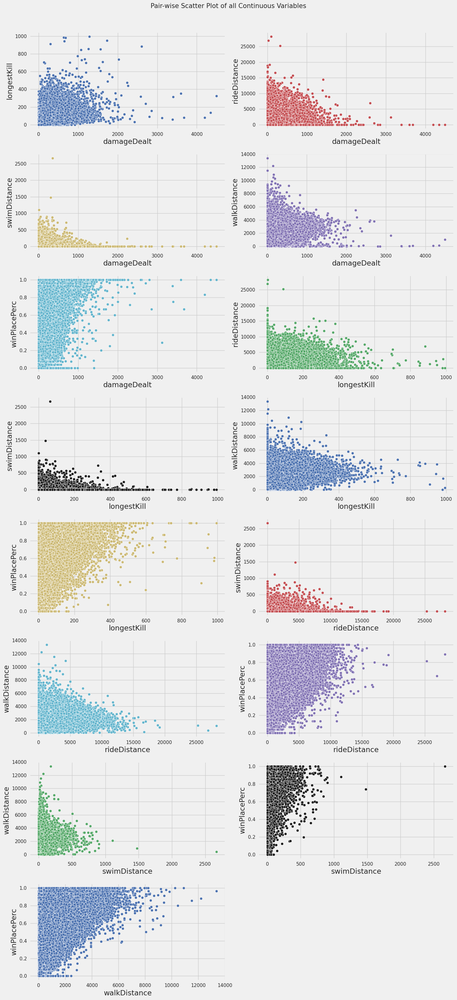

Could not draw Distribution Plot
Could not draw Distribution Plots


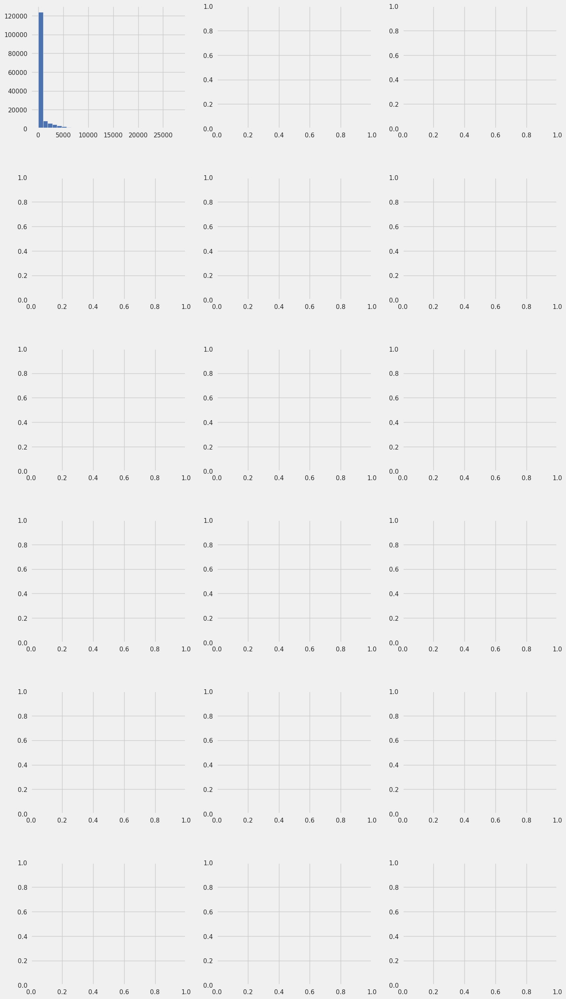

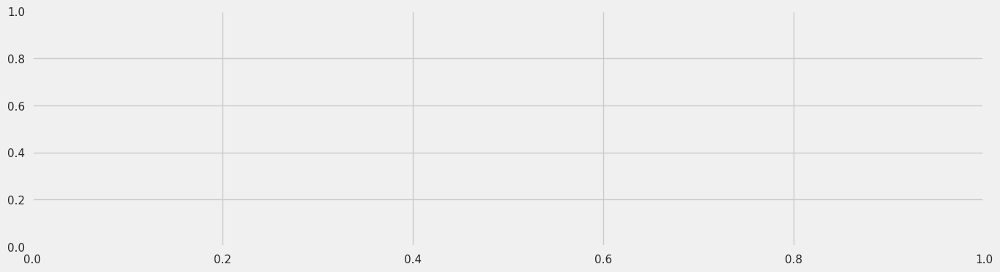

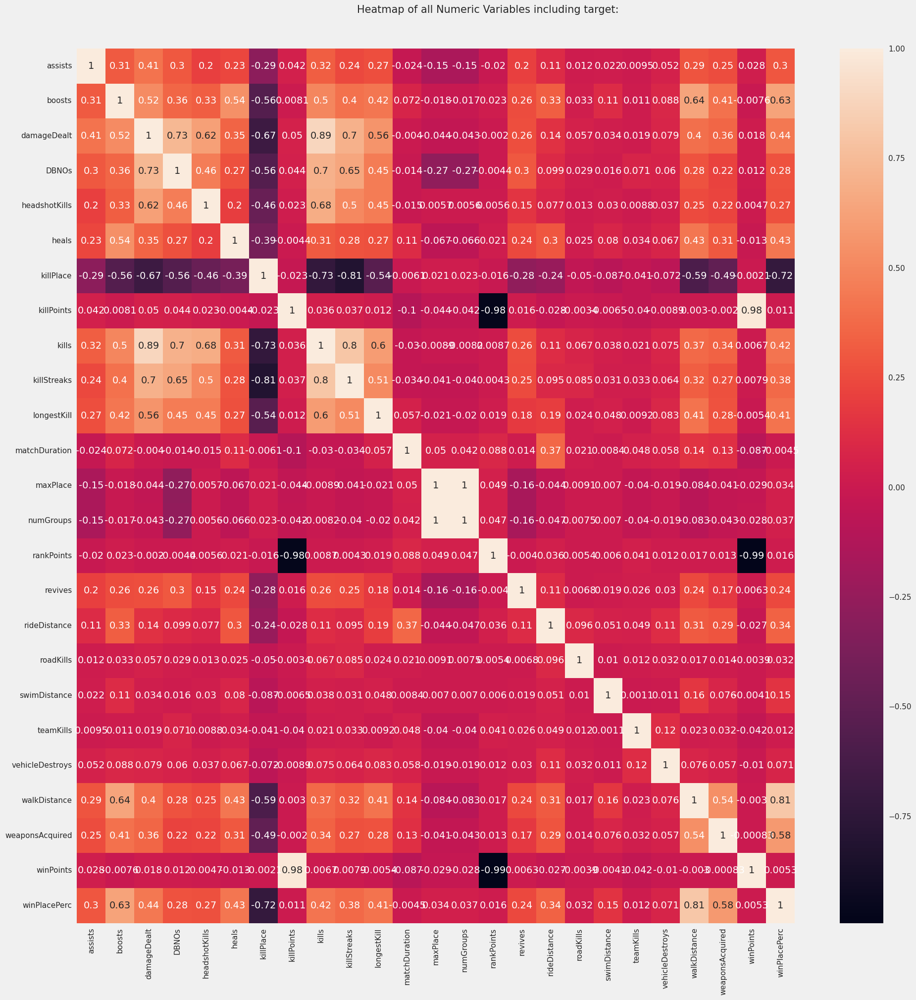

All Plots done
Time to run AutoViz = 130 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [21]:
import matplotlib.pyplot as plt
%matplotlib inline
filename="/content/drive/MyDrive/pubg.csv"

pb=AV.AutoViz(
    filename
)

## Data Preprocessing

In [ ]:
# data preprocessing
numerics = ['int64', 'float64']

newdf = pb.select_dtypes(include=numerics)

In [ ]:
import statistics
def median_imputation(column):
    median_value = column.median()
    return column.fillna(median_value)

In [ ]:

for column in newdf.columns:
    newdf[column] = median_imputation(newdf[column])

In [ ]:
newdf.isnull().sum()

assists            0
boosts             0
damageDealt        0
DBNOs              0
headshotKills      0
heals              0
killPlace          0
killPoints         0
kills              0
killStreaks        0
longestKill        0
matchDuration      0
maxPlace           0
numGroups          0
rankPoints         0
revives            0
rideDistance       0
roadKills          0
swimDistance       0
teamKills          0
vehicleDestroys    0
walkDistance       0
weaponsAcquired    0
winPoints          0
winPlacePerc       0
dtype: int64

In [ ]:
cat_col=pb.select_dtypes('object')
cat_col

,Id,groupId,matchId,matchType
0,7f96b2f878858a,4d4b580de459be,a10357fd1a4a91,squad-fpp
1,eef90569b9d03c,684d5656442f9e,aeb375fc57110c,squad-fpp
2,1eaf90ac73de72,6a4a42c3245a74,110163d8bb94ae,duo
3,4616d365dd2853,a930a9c79cd721,f1f1f4ef412d7e,squad-fpp
4,315c96c26c9aac,de04010b3458dd,6dc8ff871e21e6,solo-fpp
...,...,...,...,...
4446961,afff7f652dbc10,d238e426f50de7,18492834ce5635,squad-fpp
4446962,f4197cf374e6c0,408cdb5c46b2ac,ee854b837376d9,solo
4446963,e1948b1295c88a,e26ac84bdf7cef,6d0cd12784f1ab,squad-fpp
4446964,cc032cdd73b7ac,c2223f35411394,c9c701d0ad758a,squad-fpp


## Check for outliers and handle them

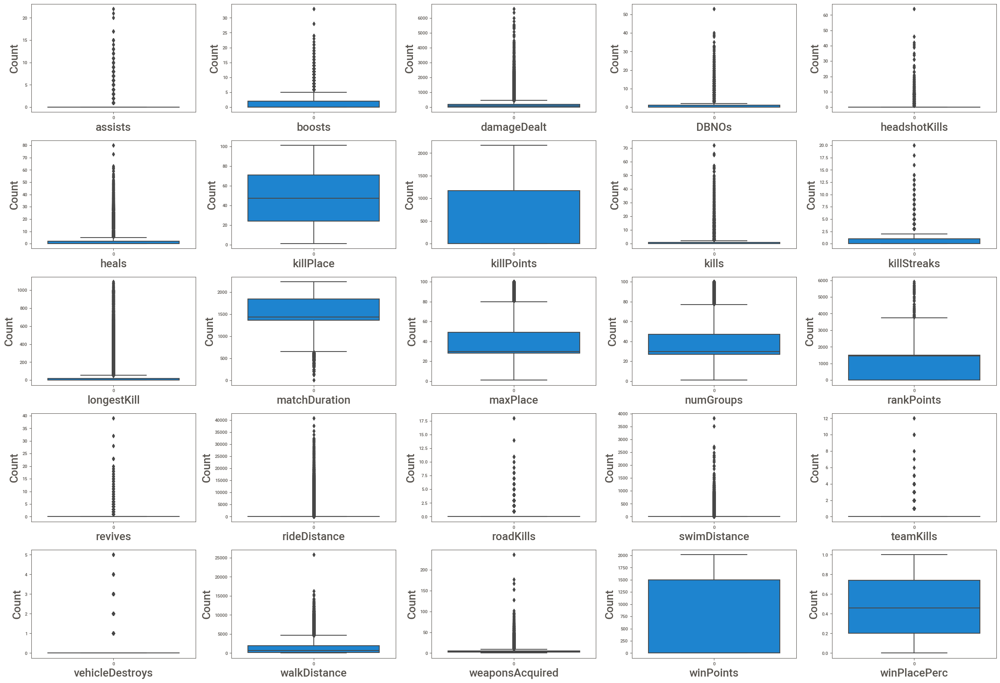

In [ ]:
plt.figure(figsize=(25,20),facecolor='white')
plotnumber=1
for column in newdf:
    if plotnumber<=30 :
        ax=plt.subplot(6,5,plotnumber)
        sns.boxplot(newdf[column])
        plt.xlabel(column,fontsize=20)
        plt.ylabel("Count",fontsize=20)
    plotnumber+=1
plt.tight_layout()
plt.show()

In [ ]:
# Calculate the IQR for each column
iqr = newdf.quantile([0.75, 0.25])

# Print the IQR for each column
print(iqr)

      assists  boosts  damageDealt  DBNOs  headshotKills  heals  killPlace  \
0.75      0.0     2.0        186.0    1.0            0.0    2.0       71.0   
0.25      0.0     0.0          0.0    0.0            0.0    0.0       24.0   

      killPoints  kills  killStreaks  ...  revives  rideDistance  roadKills  \
0.75      1172.0    1.0          1.0  ...      0.0      0.190975        0.0   
0.25         0.0    0.0          0.0  ...      0.0      0.000000        0.0   

      swimDistance  teamKills  vehicleDestroys  walkDistance  weaponsAcquired  \
0.75           0.0        0.0              0.0        1976.0              5.0   
0.25           0.0        0.0              0.0         155.1              2.0   

      winPoints  winPlacePerc  
0.75     1495.0        0.7407  
0.25        0.0        0.2000  

[2 rows x 25 columns]


/tmp/ipykernel_33/1072528449.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(newdf[column])
/tmp/ipykernel_33/1072528449.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(newdf[column])
/tmp/ipykernel_33/1072528449.py:8: UserWarning: 

`distplot` is a deprecated function and will be remove

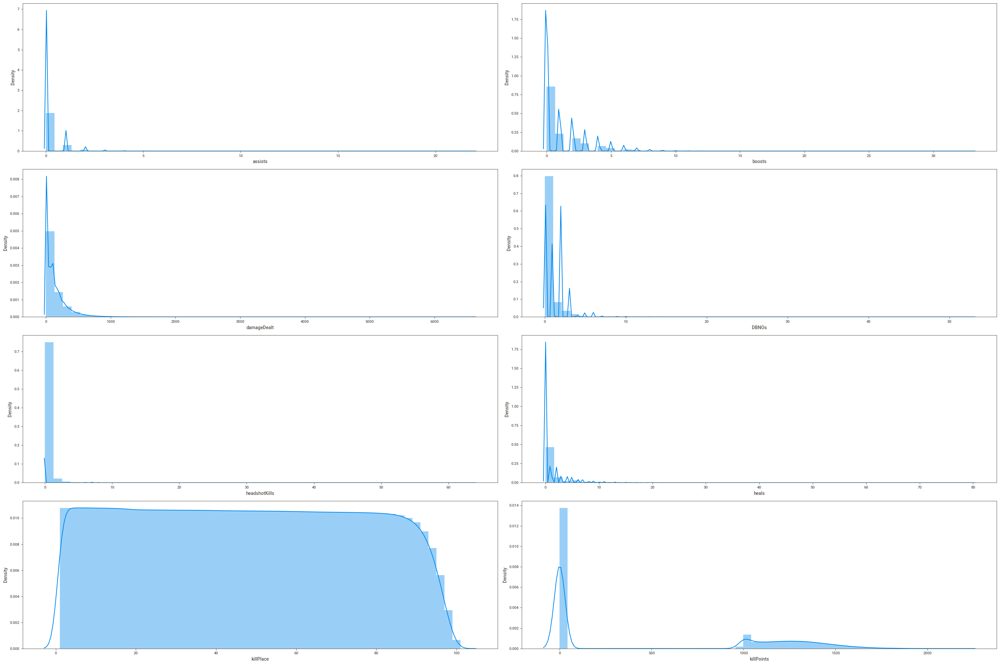

In [ ]:
plt.figure(figsize=(30,20),facecolor='white')

plotnumber=1

for column in newdf:
    if plotnumber<=8 :
        ax=plt.subplot(4,2,plotnumber)
        sns.distplot(newdf[column])

    plotnumber+=1
plt.tight_layout()

In [ ]:
newdf.dtypes

assists              int64
boosts               int64
damageDealt        float64
DBNOs                int64
headshotKills        int64
heals                int64
killPlace            int64
killPoints           int64
kills                int64
killStreaks          int64
longestKill        float64
matchDuration        int64
maxPlace             int64
numGroups            int64
rankPoints           int64
revives              int64
rideDistance       float64
roadKills            int64
swimDistance       float64
teamKills            int64
vehicleDestroys      int64
walkDistance       float64
weaponsAcquired      int64
winPoints            int64
winPlacePerc       float64
dtype: object

In [ ]:
# quartile calculation
Q1=newdf.quantile(0.25)
Q3=newdf.quantile(0.75)
IQR=Q3-Q1

In [ ]:
((newdf < (Q1 - 1.5 *IQR))| (newdf > (Q3 + 1.5 * IQR ))).sum() # it shows how many ooutliers prresent in in the data

assists             779306
boosts              142191
damageDealt         215546
DBNOs               294831
headshotKills       750850
heals               326055
killPlace                0
killPoints               0
kills               516699
killStreaks          52340
longestKill         614427
matchDuration         2626
maxPlace            701861
numGroups           698800
rankPoints              62
revives             587099
rideDistance       1110282
roadKills            12996
swimDistance        289272
teamKills            96930
vehicleDestroys      33754
walkDistance         26978
weaponsAcquired      78409
winPoints                0
winPlacePerc             0
dtype: int64

In [ ]:
((newdf < (Q1 - 1.5 *IQR))| (newdf > (Q3 + 1.5 * IQR ))).sum()/len(newdf)*100 # it shows the percentage of outliers in the data

assists            17.524443
boosts              3.197483
damageDealt         4.847035
DBNOs               6.629936
headshotKills      16.884546
heals               7.332078
killPlace           0.000000
killPoints          0.000000
kills              11.619135
killStreaks         1.176982
longestKill        13.816769
matchDuration       0.059051
maxPlace           15.782918
numGroups          15.714085
rankPoints          0.001394
revives            13.202237
rideDistance       24.967180
roadKills           0.292244
swimDistance        6.504929
teamKills           2.179688
vehicleDestroys     0.759034
walkDistance        0.606661
weaponsAcquired     1.763202
winPoints           0.000000
winPlacePerc        0.000000
dtype: float64

In [ ]:
import scipy.stats as stats

In [ ]:

## using IQR to remove the outliers
IQR = stats.iqr(pb.boosts, interpolation = 'midpoint')

IQR

2.0

In [ ]:
## min and max limit calculation

# First quartile (Q1)
Q1 = newdf.boosts.quantile(0.25)

# Third quartile (Q3)
Q3 =newdf.boosts.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR
print(min_limit)
max_limit=Q3 +1.5*IQR
print(max_limit)

-3.0
5.0


In [ ]:
# Since data is not normal replace outliers with median
newdf.loc[newdf['boosts'] > max_limit,'boosts']=np.median(newdf.boosts)

In [ ]:
# damageDealt

## using IQR to remove the outliers
IQR = stats.iqr(newdf.damageDealt, interpolation = 'midpoint')

IQR
## min and max limit calculation

# First quartile (Q1)
Q1 = newdf.damageDealt.quantile(0.25)

# Third quartile (Q3)
Q3 =newdf.damageDealt.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR
print(min_limit)
max_limit=Q3 +1.5*IQR
print(max_limit)

-279.0
465.0


In [ ]:
newdf.loc[newdf['damageDealt'] > max_limit,'damageDealt']=np.median(newdf.damageDealt)

In [ ]:
# killStreaks

## using IQR to remove the outliers
IQR = stats.iqr(newdf.killStreaks, interpolation = 'midpoint')

IQR
## min and max limit calculation

# First quartile (Q1)
Q1 = newdf.killStreaks.quantile(0.25)

# Third quartile (Q3)
Q3 =newdf.killStreaks.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR
print(min_limit)
max_limit=Q3 +1.5*IQR
print(max_limit)

-1.5
2.5


In [ ]:
newdf.loc[newdf['killStreaks'] > max_limit,'killStreaks']=np.median(newdf.killStreaks)

In [ ]:
# roadKills

## using IQR to remove the outliers
IQR = stats.iqr(newdf.roadKills, interpolation = 'midpoint')

IQR
print(IQR)
## min and max limit calculation

# First quartile (Q1)
Q1 = newdf.roadKills.quantile(0.25)

# Third quartile (Q3)
Q3 =newdf.roadKills.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR
print(min_limit)
max_limit=Q3 +1.5*IQR
print(max_limit)

0.0
0.0
0.0


In [ ]:
newdf.loc[newdf['roadKills'] > max_limit,'roadKills']=np.median(newdf.roadKills)

In [ ]:
# teamKills

## using IQR to remove the outliers
IQR = stats.iqr(newdf.teamKills, interpolation = 'midpoint')

IQR
## min and max limit calculation

# First quartile (Q1)
Q1 = newdf.teamKills.quantile(0.25)

# Third quartile (Q3)
Q3 =newdf.teamKills.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR
print(min_limit)
max_limit=Q3 +1.5*IQR
print(max_limit)

0.0
0.0


In [ ]:
newdf.loc[newdf['teamKills'] > max_limit,'teamKills']=np.median(newdf.teamKills)

In [ ]:
# vehicleDestroys

## using IQR to remove the outliers
IQR = stats.iqr(newdf.vehicleDestroys, interpolation = 'midpoint')

IQR
## min and max limit calculation

# First quartile (Q1)
Q1 = newdf.vehicleDestroys.quantile(0.25)

# Third quartile (Q3)
Q3 =newdf.vehicleDestroys.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR
print(min_limit)
max_limit=Q3 +1.5*IQR
print(max_limit)

0.0
0.0


In [ ]:
newdf.loc[newdf['vehicleDestroys'] > max_limit,'vehicleDestroys']=np.median(newdf.vehicleDestroys)

In [ ]:
# walkDistance

## using IQR to remove the outliers
IQR = stats.iqr(newdf.walkDistance, interpolation = 'midpoint')

IQR
print(IQR)
## min and max limit calculation

# First quartile (Q1)
Q1 = newdf.walkDistance.quantile(0.25)

# Third quartile (Q3)
Q3 =newdf.walkDistance.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR
print(min_limit)
max_limit=Q3 +1.5*IQR
print(max_limit)

1820.9
-2576.2500000000005
4707.35


In [ ]:
newdf.loc[newdf['walkDistance'] > max_limit,'walkDistance']=np.median(newdf.walkDistance)

In [ ]:
# weaponsAcquired

## using IQR to remove the outliers
IQR = stats.iqr(newdf.weaponsAcquired, interpolation = 'midpoint')

IQR
## min and max limit calculation

# First quartile (Q1)
Q1 = newdf.weaponsAcquired.quantile(0.25)

# Third quartile (Q3)
Q3 =newdf.weaponsAcquired.quantile(0.75)

##getting the limits
min_limit=Q1 - 1.5*IQR
print(min_limit)
max_limit=Q3 +1.5*IQR
print(max_limit)

-2.5
9.5


In [ ]:
newdf.loc[newdf['weaponsAcquired'] > max_limit,'weaponsAcquired']=np.median(newdf.weaponsAcquired)

## Scaling

In [ ]:
# scaling
from sklearn.preprocessing import MinMaxScaler

In [ ]:
# Min max scaler
from sklearn.preprocessing import MinMaxScaler
scaling=MinMaxScaler()
newdf.iloc[:,:26]=scaling.fit_transform(newdf.iloc[:,:26])


In [ ]:
newdf

,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,...,revives,rideDistance,roadKills,swimDistance,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc
0,0.000000,0.0,0.000000,0.000000,0.000000,0.0000,0.59,0.571889,0.000000,0.0,...,0.000000,0.000000e+00,0,0.000000,0,0,0.052008,0.111111,0.728266,0.4444
1,0.000000,0.0,0.196710,0.000000,0.000000,0.0000,0.56,0.000000,0.000000,0.0,...,0.000000,1.105380e-07,0,0.002888,0,0,0.304653,0.555556,0.000000,0.6400
2,0.045455,0.0,0.146237,0.000000,0.000000,0.0000,0.46,0.000000,0.000000,0.0,...,0.000000,0.000000e+00,0,0.000000,0,0,0.034374,0.222222,0.000000,0.7755
3,0.000000,0.0,0.070753,0.000000,0.000000,0.0000,0.74,0.000000,0.000000,0.0,...,0.000000,0.000000e+00,0,0.000000,0,0,0.043064,0.333333,0.000000,0.1667
4,0.000000,0.0,0.215054,0.000000,0.000000,0.0000,0.44,0.000000,0.013889,0.5,...,0.000000,0.000000e+00,0,0.000000,0,0,0.010569,0.222222,0.000000,0.1875
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4446961,0.000000,0.0,0.000000,0.000000,0.000000,0.0000,0.73,0.474194,0.000000,0.0,...,0.000000,3.173667e-02,0,0.000000,0,0,0.216486,0.333333,0.748634,0.1786
4446962,0.000000,0.2,0.094946,0.000000,0.000000,0.0000,0.68,0.000000,0.000000,0.0,...,0.000000,0.000000e+00,0,0.000000,0,0,0.017357,0.666667,0.000000,0.2935
4446963,0.000000,0.0,0.127011,0.000000,0.000000,0.0000,0.65,0.000000,0.000000,0.0,...,0.000000,0.000000e+00,0,0.000571,0,0,0.167559,0.444444,0.000000,0.4815
4446964,0.000000,0.8,0.387957,0.018868,0.015625,0.0250,0.10,0.000000,0.027778,0.5,...,0.051282,0.000000e+00,0,0.000000,0,0,0.583811,0.888889,0.000000,0.8000


In [ ]:
# ctaegorical data
cat_col=pb.select_dtypes('object')
cat_col

,Id,groupId,matchId,matchType
0,7f96b2f878858a,4d4b580de459be,a10357fd1a4a91,squad-fpp
1,eef90569b9d03c,684d5656442f9e,aeb375fc57110c,squad-fpp
2,1eaf90ac73de72,6a4a42c3245a74,110163d8bb94ae,duo
3,4616d365dd2853,a930a9c79cd721,f1f1f4ef412d7e,squad-fpp
4,315c96c26c9aac,de04010b3458dd,6dc8ff871e21e6,solo-fpp
...,...,...,...,...
4446961,afff7f652dbc10,d238e426f50de7,18492834ce5635,squad-fpp
4446962,f4197cf374e6c0,408cdb5c46b2ac,ee854b837376d9,solo
4446963,e1948b1295c88a,e26ac84bdf7cef,6d0cd12784f1ab,squad-fpp
4446964,cc032cdd73b7ac,c2223f35411394,c9c701d0ad758a,squad-fpp


## Converting categorical data into numerical data

## Label Encoder

In [ ]:
# encoding
# Import label encoder
from sklearn import preprocessing

# label_encoder object knows
# how to understand word labels.
label_encoder = preprocessing.LabelEncoder()

# Encode labels in column 'Id'.
cat_col['Id']= label_encoder.fit_transform(cat_col['Id'])

cat_col['Id'].unique()

array([2216109, 4151025,  532102, ..., 3918839, 3544314,  235633])

In [ ]:
# Encode labels in column 'Id'.
cat_col['groupId']= label_encoder.fit_transform(cat_col['groupId'])

cat_col['groupId'].unique()

array([ 613775,  827823,  843521, ..., 1364381,  512970, 1114108])

In [ ]:
# Encode labels in column 'Id'.
cat_col['matchType']= label_encoder.fit_transform(cat_col['matchType'])

cat_col['matchType'].unique()

array([15,  2, 13, 14,  3, 12, 11,  0,  5,  9,  4,  7,  6, 10,  1,  8])

In [ ]:
# Encode labels in column 'Id'.
cat_col['matchId']= label_encoder.fit_transform(cat_col['matchId'])

cat_col['matchId'].unique()

array([30086, 32752,  3143, ...,  6236,  6340, 47293])

In [ ]:
cat_col

,Id,groupId,matchId,matchType
0,2216109,613775,30086,15
1,4151025,827823,32752,15
2,532102,843521,3143,2
3,1216707,1340462,45261,15
4,856521,1757849,20532,13
...,...,...,...,...
4446961,3056686,1664316,4448,15
4446962,4240134,512970,44628,12
4446963,3918839,1792643,20383,15
4446964,3544314,1537012,37720,15


In [ ]:
cat_col.isnull().sum()

Id           0
groupId      0
matchId      0
matchType    0
dtype: int64

In [ ]:
newdf.isnull().sum()

assists            0
boosts             0
damageDealt        0
DBNOs              0
headshotKills      0
heals              0
killPlace          0
killPoints         0
kills              0
killStreaks        0
longestKill        0
matchDuration      0
maxPlace           0
numGroups          0
rankPoints         0
revives            0
rideDistance       0
roadKills          0
swimDistance       0
teamKills          0
vehicleDestroys    0
walkDistance       0
weaponsAcquired    0
winPoints          0
winPlacePerc       0
dtype: int64

In [ ]:
cat_col.shape

(4446966, 4)

In [ ]:
newdf.shape

(4446966, 25)

In [ ]:
# Create the first DataFrame
newdf= pd.DataFrame(newdf)

# Create the second DataFrame
cat_col = pd.DataFrame(cat_col)

# Join the two DataFrames
joined_df = newdf.join(cat_col)

# Print the joined DataFrame
print(joined_df)

          assists  boosts  damageDealt     DBNOs  headshotKills   heals  \
0        0.000000     0.0     0.000000  0.000000       0.000000  0.0000   
1        0.000000     0.0     0.196710  0.000000       0.000000  0.0000   
2        0.045455     0.0     0.146237  0.000000       0.000000  0.0000   
3        0.000000     0.0     0.070753  0.000000       0.000000  0.0000   
4        0.000000     0.0     0.215054  0.000000       0.000000  0.0000   
...           ...     ...          ...       ...            ...     ...   
4446961  0.000000     0.0     0.000000  0.000000       0.000000  0.0000   
4446962  0.000000     0.2     0.094946  0.000000       0.000000  0.0000   
4446963  0.000000     0.0     0.127011  0.000000       0.000000  0.0000   
4446964  0.000000     0.8     0.387957  0.018868       0.015625  0.0250   
4446965  0.000000     0.4     0.576344  0.000000       0.000000  0.0125   

         killPlace  killPoints     kills  killStreaks  ...  teamKills  \
0             0.59    0.57

In [ ]:
joined_df

,assists,boosts,damageDealt,DBNOs,headshotKills,heals,killPlace,killPoints,kills,killStreaks,...,teamKills,vehicleDestroys,walkDistance,weaponsAcquired,winPoints,winPlacePerc,Id,groupId,matchId,matchType
0,0.000000,0.0,0.000000,0.000000,0.000000,0.0000,0.59,0.571889,0.000000,0.0,...,0,0,0.052008,0.111111,0.728266,0.4444,2216109,613775,30086,15
1,0.000000,0.0,0.196710,0.000000,0.000000,0.0000,0.56,0.000000,0.000000,0.0,...,0,0,0.304653,0.555556,0.000000,0.6400,4151025,827823,32752,15
2,0.045455,0.0,0.146237,0.000000,0.000000,0.0000,0.46,0.000000,0.000000,0.0,...,0,0,0.034374,0.222222,0.000000,0.7755,532102,843521,3143,2
3,0.000000,0.0,0.070753,0.000000,0.000000,0.0000,0.74,0.000000,0.000000,0.0,...,0,0,0.043064,0.333333,0.000000,0.1667,1216707,1340462,45261,15
4,0.000000,0.0,0.215054,0.000000,0.000000,0.0000,0.44,0.000000,0.013889,0.5,...,0,0,0.010569,0.222222,0.000000,0.1875,856521,1757849,20532,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4446961,0.000000,0.0,0.000000,0.000000,0.000000,0.0000,0.73,0.474194,0.000000,0.0,...,0,0,0.216486,0.333333,0.748634,0.1786,3056686,1664316,4448,15
4446962,0.000000,0.2,0.094946,0.000000,0.000000,0.0000,0.68,0.000000,0.000000,0.0,...,0,0,0.017357,0.666667,0.000000,0.2935,4240134,512970,44628,12
4446963,0.000000,0.0,0.127011,0.000000,0.000000,0.0000,0.65,0.000000,0.000000,0.0,...,0,0,0.167559,0.444444,0.000000,0.4815,3918839,1792643,20383,15
4446964,0.000000,0.8,0.387957,0.018868,0.015625,0.0250,0.10,0.000000,0.027778,0.5,...,0,0,0.583811,0.888889,0.000000,0.8000,3544314,1537012,37720,15


In [ ]:
joined_df.isnull().sum()

assists            0
boosts             0
damageDealt        0
DBNOs              0
headshotKills      0
heals              0
killPlace          0
killPoints         0
kills              0
killStreaks        0
longestKill        0
matchDuration      0
maxPlace           0
numGroups          0
rankPoints         0
revives            0
rideDistance       0
roadKills          0
swimDistance       0
teamKills          0
vehicleDestroys    0
walkDistance       0
weaponsAcquired    0
winPoints          0
winPlacePerc       0
Id                 0
groupId            0
matchId            0
matchType          0
dtype: int64

## Feature Engineering

<Axes: >

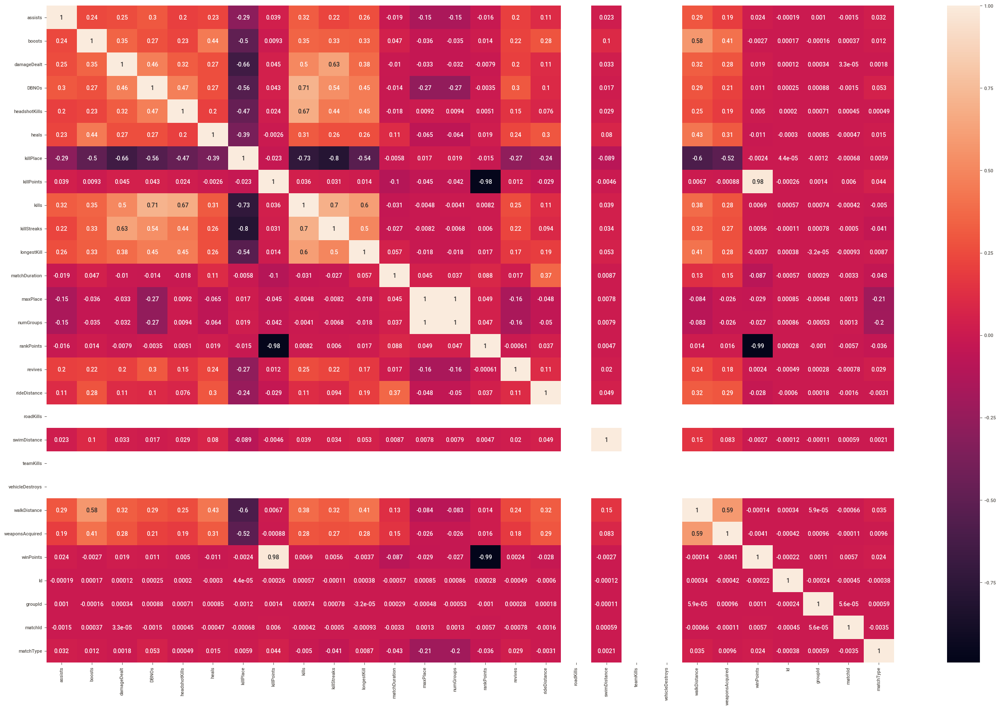

In [ ]:
plt.figure(figsize=(32,20))
sns.heatmap(joined_df.drop('winPlacePerc',axis=1).corr(),annot=True)

## Model Creation

In [ ]:
# Drop the id column
joined_df = joined_df.drop('Id', axis=1) # id indicates only the players id it doesnt affect the performence
joined_df = joined_df.drop('winPoints', axis=1) # it has high corelation

In [ ]:
print(joined_df.shape)

(4446966, 27)


In [ ]:
# model creation
# Split data into x and y
x=joined_df.drop('winPlacePerc',axis=1)
y=joined_df[['winPlacePerc']]

In [ ]:
# split data for training and testing
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=4)

In [ ]:
x_train.shape

(3112876, 26)

In [ ]:
# import Linear Regression model
from sklearn.linear_model import LinearRegression
# initialise model
model=LinearRegression()
# train model
model.fit(x_train,y_train)
# make predictions
y_pred=model.predict(x_test)

In [ ]:
actual_value=y_test.copy()

In [ ]:
actual_value["pred"]=y_pred

In [ ]:
actual_value

,winPlacePerc,pred
55000,0.5435,0.436114
4350230,0.5714,0.414190
223008,0.7407,0.868140
3221277,0.8077,0.683283
1433392,0.5532,0.418240
...,...,...
3394646,0.1250,0.030193
44101,0.4000,0.325870
1238216,0.9167,0.703608
1330307,0.0667,-0.005479


In [ ]:
y_test

,winPlacePerc
55000,0.5435
4350230,0.5714
223008,0.7407
3221277,0.8077
1433392,0.5532
...,...
3394646,0.1250
44101,0.4000
1238216,0.9167
1330307,0.0667


In [ ]:
# linear regression
from sklearn.metrics import mean_squared_error,mean_absolute_error,r2_score

In [ ]:
# mean absolute error
MAE=mean_absolute_error(y_test,y_pred)
MAE

0.09193246815256853

In [ ]:
# Mean squared error
MSE=mean_squared_error(y_test,y_pred)
MSE

0.015881476784379525

In [ ]:
# Root mean squared error
RMSE=np.sqrt(MSE)
RMSE

0.12602173139732498

In [ ]:
# R-squared
r2_score(y_test,y_pred)

0.8319732191009308

In [ ]:
y_test.shape

(1334090, 1)

In [ ]:
adjr2=1-(1-0.8319732191009309)*(1334090-1)/(1334090-29-1)
# R^2 is the R-squared value of the model
# n is the number of observations in the dataset
# p is the number of independent variables in the model

In [ ]:
adjr2

0.8319695665091089

In [ ]:
# import Linear Regression model
from sklearn.linear_model import LinearRegression

In [ ]:
from sklearn.model_selection import GridSearchCV
import sklearn.model_selection

In [ ]:
# Create a linear regression model
lr = LinearRegression()

# Define the hyperparameters to tune
hyperparameters = {}

# Create a grid search object
grid_search = GridSearchCV(lr, hyperparameters, cv=5, n_jobs=4)

# Fit the grid search object to the training data
grid_search.fit(x_train, y_train)

# Print the best parameters
print(grid_search.best_params_)

{}


Using XGBOOST

In [ ]:
#importing the model library
from xgboost import XGBRegressor

#xgb_r = XGBRegressor(objective ='reg:linear', n_estimators = 10, seed = 123)

xgb= XGBRegressor() ## object creation

xgb.fit(x_train,y_train)# fitting the data

y_pred_xgb=xgb.predict(x_test)#predicting the price

In [ ]:
xgb.score(x_train,y_train)

0.930606078584828

In [ ]:
print('MAE:', mean_absolute_error(y_test, y_pred_xgb))

print('MSE:', mean_squared_error(y_test, y_pred_xgb))

print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred_xgb)))

MAE: 0.05837699280937898
MSE: 0.006668334461871725
RMSE: 0.08165987057222002


In [ ]:
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score

In [ ]:
score_xgb=round(r2_score(y_test, y_pred_xgb)*100,2)

print("The r2 score achieved using  XG boost is: ",score_xgb)

The r2 score achieved using  XG boost is:  92.94


Hyper parameter tunning in XG boost`
n_estimators = no. of models

max_depth = The maximum depth of a tree

learning_rate=Typical final values to be used: 0.01-0.3

gamma=

Gamma specifies the minimum loss reduction required to make a split. It controls the overfitting.

Ranges from 0 to ∞.

subsample=

no of samples to be used. For eg: 0.5 -> half of the training data (50%) used to train each tree.
Lower values make the algorithm more conservative and prevents overfitting but too
small values might lead to under-fitting.Typical values: 0.5-1. Range: (0,1)
colsample_bytree=

Denotes the fraction of columns to be randomly samples for each tree. Ranges from 0 to 1
ie., % of features should be taken for each tree

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

params={'max_depth':[3,4,5,6],
        'learning_rate':[0.1,0.2,0.3] ,
        'n_estimators':[int(x) for x in np.linspace(start=200, stop=2000, num=10)] ,
        'gamma':[0, 1, 2, 3, 4],
        'subsample':[0.5,0.7,1] ,
        'colsample_bytree':[0.5,0.7,1]
}

In [ ]:
xgb_rcv= RandomizedSearchCV(xgb, scoring='r2',param_distributions=params , n_iter=100, cv=3,
                                random_state=35, n_jobs=-1)

xgb_rcv.fit(x_train, y_train) ##training data on randomsearch cv.

In [ ]:
xgb_rcv.best_params_

In [ ]:
xgb2=XGBRegressor(subsample= 1,
 n_estimators= 1200,
 max_depth= 4,
 learning_rate= 0.1,
 gamma=3,
 colsample_bytree= 0.5)

xgb2.fit(x_train, y_train)#training

In [ ]:
y_pred_xgb2=xgb2.predict(x_test)#testing

In [ ]:
score_xgb2=round(r2_score(y_test, y_pred_xgb2)*100,2)

print("The r2 score achieved using  XG boost is: "+str(score_xgb2)+" %" )

using gradient boosting

In [ ]:
## importing the model library
from sklearn.ensemble import GradientBoostingRegressor

gb=GradientBoostingRegressor() ## object creation

gb.fit(x_train,y_train) ## fitting the data

y_pred_gb=gb.predict(x_test)#predicting the price

/opt/conda/lib/python3.10/site-packages/sklearn/ensemble/_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
gb.score(x_train,y_train)

0.8968252223679198

In [ ]:
print('MAE:', mean_absolute_error(y_test, y_pred_gb))

print('MSE:', mean_squared_error(y_test, y_pred_gb))

print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred_gb)))

MAE: 0.07025893306073978
MSE: 0.009781657610235748
RMSE: 0.09890226291766913


In [ ]:
score_gb=round(r2_score(y_test, y_pred_gb)*100,2)

print("The r2 score achieved using  Gradient Boosting is: "+str(score_gb)+" %")

The r2 score achieved using  Gradient Boosting is: 89.65 %


In [ ]:
# decision tree
from sklearn.tree import DecisionTreeRegressor

dt = DecisionTreeRegressor()
dt.fit(x_train,y_train)
y_pred_dt = dt.predict(x_test)

In [ ]:
dt.score(x_train,y_train)

1.0

In [ ]:
print('MAE:', mean_absolute_error(y_test, y_pred_dt))
print('MSE:', mean_squared_error(y_test, y_pred_dt))
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred_dt)))

MAE: 0.08113550382657835
MSE: 0.013631015347712674
RMSE: 0.11675193937452463


In [ ]:
score_dt = round(r2_score(y_test,y_pred_dt)*100,2)

print("The r2 score achieved using Decision Tree is: "+str(score_dt)+" %")

The r2 score achieved using Decision Tree is: 85.58 %


## Conclusion



*   The best model is XG Boost with r2_score of 0.92.

*   The second best model followed by Gradient Boosting with r2_score
     of 89.65.

*   Some of the best features which has high impact on winner are total match ,win points,match id and win placeperc.



